<h1 style="text-align: center;" markdown="1">Cod data recalling</h1>




In [1]:
import seaborn as sns
import pandas as pd
import itertools
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, gaussian_filter1d
import plotly.graph_objs as go
import pytablewriter

from pycoQC.pycoQC import pycoQC
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode (connected=False)

#%load_ext rpy2.ipython

def reads_1D_data (df, field_name="num_bases", xscale="linear", nbins=200, smooth_sigma=2, sample=1000000):
        """Private function preparing data for reads_len_1D and reads_qual_1D"""
        # Downsample if needed
        if sample and len(df)>sample:
            df = df.sample(sample)

            
       
        #Extract data field from df
        data = df[field_name].values

        # Count each categories in log or linear space
        min = np.nanmin(data)
        max = np.nanmax(data)
        if xscale == "log":
            count_y, bins = np.histogram (a=data, bins=np.logspace (np.log10(min), np.log10(max)+0.1, nbins))
        elif xscale == "linear":
            count_y, bins = np.histogram (a=data, bins= np.linspace (min, max, nbins))

        # Remove last bin from labels
        count_x = bins[1:]

        # Smooth results with a savgol filter
        if smooth_sigma:
            count_y = gaussian_filter1d (count_y, sigma=smooth_sigma)

        # Get percentiles percentiles
        stat = np.percentile (data, [10,25,50,75,90])
        y_max = count_y.max()

        data_dict = dict (
            x = [count_x, [stat[0],stat[0]], [stat[1],stat[1]], [stat[2],stat[2]], [stat[3],stat[3]], [stat[4],stat[4]]],
            y = [count_y, [0,y_max], [0,y_max], [0,y_max], [0,y_max], [0,y_max]],
            name = ["Density", "10%", "25%", "Median", "75%", "90%"],
            text = ["",
                ["", "10%<br>{:,.2f}".format(stat[0])],
                ["", "25%<br>{:,.2f}".format(stat[1])],
                ["", "Median<br>{:,.2f}".format(stat[2])],
                ["", "75%<br>{:,.2f}".format(stat[3])],
                ["", "90%<br>{:,.2f}".format(stat[4])]],
        )

        # Make layout dict = Off set for labels on top
        layout_dict = {"yaxis.range": [0, y_max+y_max/6]}

        return data_dict, layout_dict

<h1 style="text-align: center;" markdown="1">Cod OLD data (Albacore)</h1>

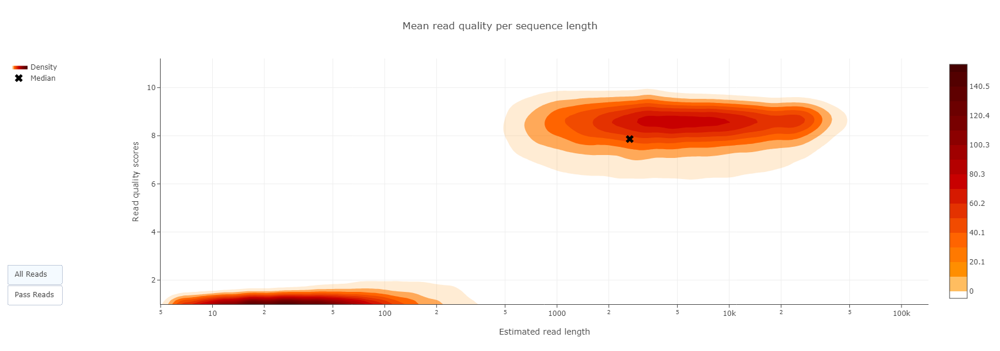

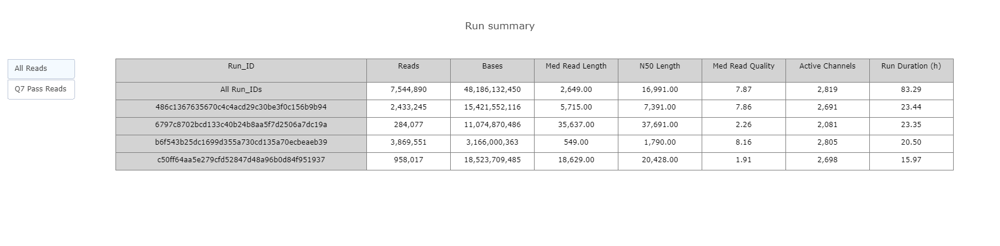

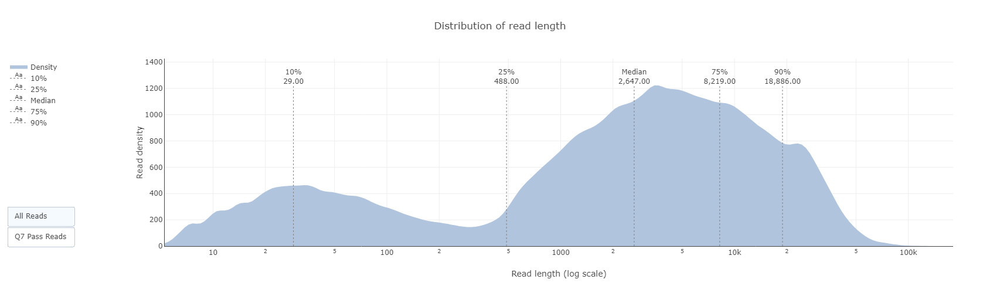

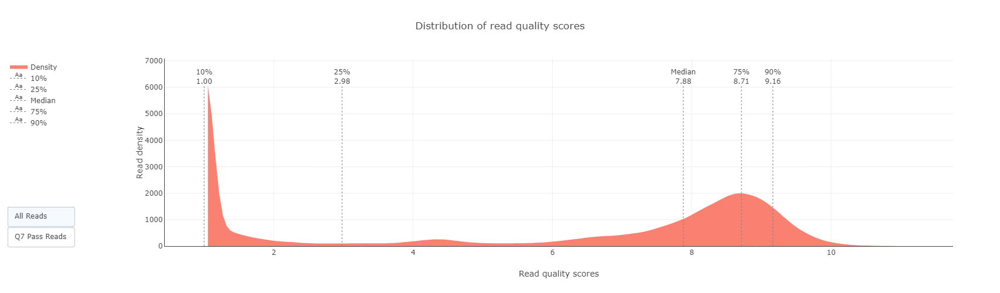

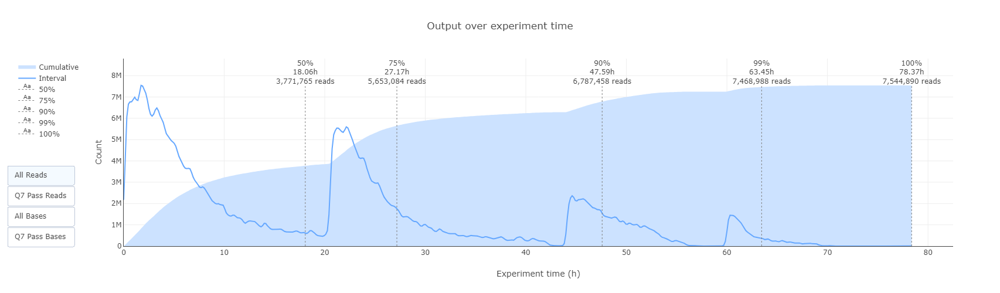

In [11]:
qtest = pycoQC("/mnt/smb/labfile/Backup/PromethION/basecalled/2019*Gmo*/*/sequencing_summary/*.sequencing_summary.txt", verbose_level=0)

fig = qtest.reads_len_qual_2D ()
iplot(fig, show_link=False)

fig1 = qtest.summary()
iplot (fig1, show_link=False)

fig2 = qtest.reads_len_1D()
iplot (fig2, show_link=False)

fig3 = qtest.reads_qual_1D()
iplot(fig3, show_link=False)

fig4 = qtest.output_over_time()
iplot(fig4, show_link=False)



<h1 style="text-align: center;" markdown="1">Cod NEW data (Guppy 2.2.3)</h1>

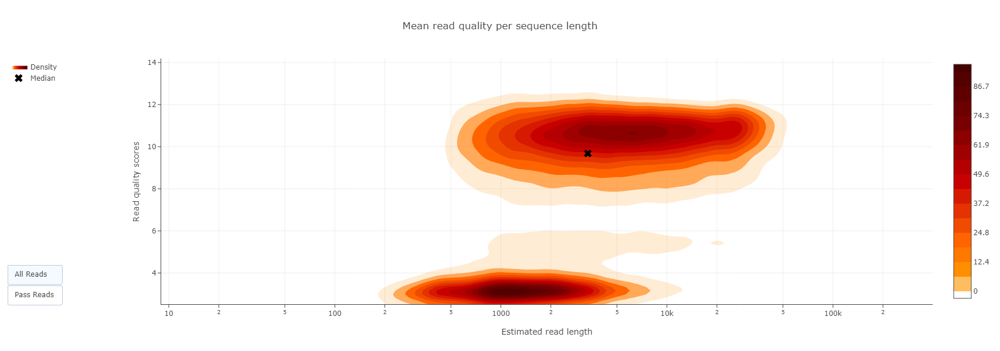

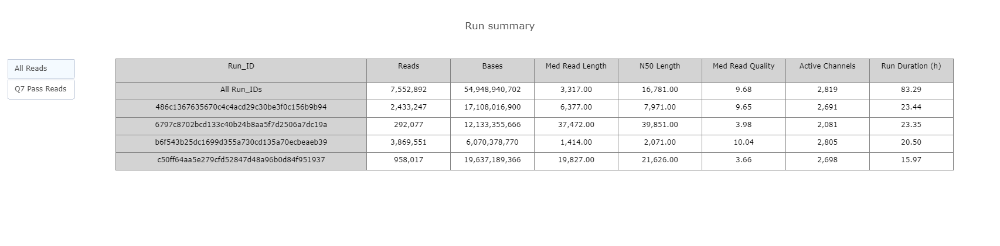

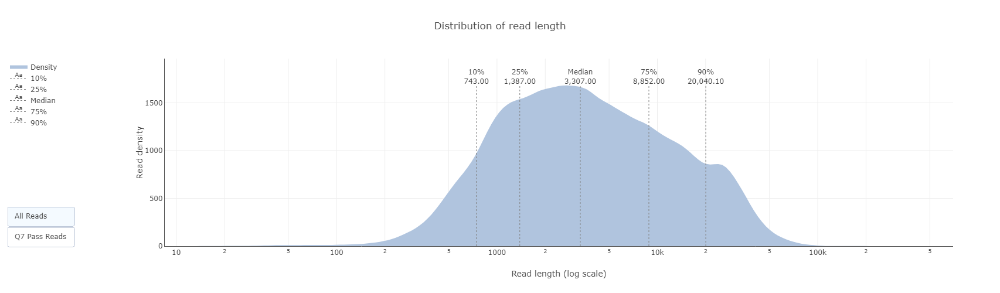

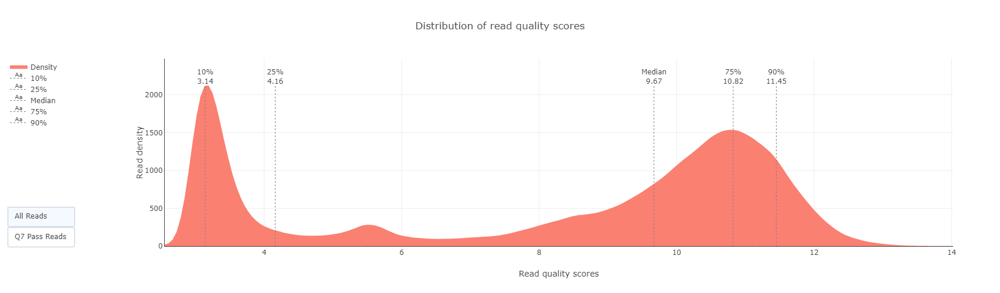

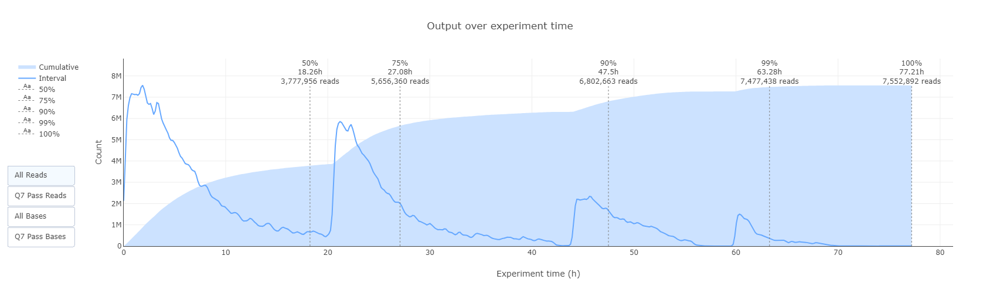

In [10]:
qtest1 = pycoQC("/mnt/smb/labfile/Backup/PromethION/rebasecalled/Cod/sequencing_summary/*sequencing_summary.txt", verbose_level=0)

fig = qtest1.reads_len_qual_2D ()
iplot(fig, show_link=False)

fig1 = qtest1.summary()
iplot (fig1, show_link=False)

fig2 = qtest1.reads_len_1D()
iplot (fig2, show_link=False)

fig3 = qtest1.reads_qual_1D()
iplot(fig3, show_link=False)

fig4 = qtest1.output_over_time()
iplot(fig4, show_link=False)

